Equations from https://proceedings.neurips.cc/paper/2000/file/f9d1152547c0bde01830b7e8bd60024c-Paper.pdf

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from sklearn.cluster import KMeans
import numpy
import matplotlib.pyplot as mtp

In [ ]:
from google.colab import drive
drive.mount('/content/Drive')

Mounted at /content/Drive


# Code Library

In [ ]:
import time

def extractFrameFromImage(filePath, imageLimit, frame_rate):
  vidcap = cv2.VideoCapture(filePath)
  success,image = vidcap.read()
  count = 0
  #define framerate
  frame_rate = 10
  prev = 0
  frame=0
  while success:
    time_elapsed = time.time() - prev
    success,image = vidcap.read()  
    if time_elapsed > 1./frame_rate:
      prev = time.time()
      cv2.imwrite("%d.jpg" % count, image)     # save frame as JPEG file      
      #print('Read a new frame: ', success)
      count=count+1
      frame += frame_rate # i.e. at 30 fps, this advances one second
      vidcap.set(cv2.CAP_PROP_POS_FRAMES, frame)
    if count>=imageLimit:
      break
  vidcap.release()
  cv2.destroyAllWindows()

  

In [ ]:
def checkCrop():
  img=cv2.imread('/content/9.jpg')
  img=img[350:600,400:600]
  cv2_imshow(img)

In [ ]:
import os
def countWidthandHeight():
  img=cv2.imread('/content/9.jpg')
  
  image = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  #resize
  
  width = int(image.shape[1]/7)
  
  height = int(image.shape[0]/7)
  
  print(width, height)

  


  count=0

  for image_name in os.listdir('/content'):
    extension = os.path.splitext(image_name)[1][1:]
    if extension=='jpg':
      count=count+1

  return width, height, count

In [ ]:


def convertAllImageToMatrix(width, height, x): # x = number of images
  
 

  y = width*height 

  m = np.zeros(shape=(x, int(y)))
  print(m.shape)
  itr = 0
  name_list = []
  for image_name in os.listdir('/content'):
    extension = os.path.splitext(image_name)[1][1:]
    if extension=='jpg':
      image_path='/content/'+image_name
      image = cv2.imread(image_path)
      #####flip image
      #image=cv2.flip(image,0)
      #crop image
      #img=image[350:600,400:600]
      #grayscale	
      image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
      #resize
      dim = (width, height)
      print(width, height)
      #resizing image
      resized = cv2.resize(image, dim, interpolation = cv2.INTER_AREA)
      #rows,cols = resized.shape # gives dimensions for RGB array
      
      rows,cols=resized.shape#normal shape
      img_size = rows*cols
      img_1D_vector = resized.reshape(img_size)
      
      #print(img_1D_vector)
      #np.append(m, img_1D_vector,axis=0)
      m[itr]=img_1D_vector
      itr=itr+1
      name_list.append(image_name)
      print(itr)
      
  return m, name_list, itr

In [ ]:
def normalizeM(m):
  sum=0
  row, col=m.shape
  for i in range(0,row):
    for j in range(0,col):
      sum+=m[i][j]
  mean=sum/row*col 

  m=m/mean

  return m, mean

In [ ]:
def updateW(x,w,h):
  #XVT
  ht=np.transpose(h)
  numerator=np.matmul(x,ht)
  #UVVT
  den1=np.matmul(w,h)
  denominator=np.matmul(den1,ht)

  #return
  print('u')
  secondPart=np.divide(numerator,denominator)
  return np.multiply(w,secondPart)

In [ ]:
def updateH(x,w,h):
  #UT*X
  wt=np.transpose(w)
  numerator=np.matmul(wt,x)
  #UTUV
  den1=np.matmul(w,h)
  denominator=np.matmul(wt,den1)
  
  #update return
  print('v')
  secondPart=np.divide(numerator,denominator)
  return np.multiply(h,secondPart)

In [ ]:
def performNMF(x, featureNo, imageCount, EPSILON=1e-9):
  w=np.random.normal(3,2.5,size=(imageCount,featureNo))
  h=np.random.normal(3,2.5,size=(featureNo, x.shape[1]))

  print("Shape of W: "+str(w.shape))
  print("Shape of H: "+str(h.shape))

  itr=0
  cost=np.linalg.norm(x-np.matmul(w,h))
  while cost>EPSILON:
    if itr%2==0:
      h=updateH(x,w,h)
    else:
      w=updateW(x,w,h)
    wh=np.matmul(w,h)
    print(w,h)
    cost=np.linalg.norm(x-wh)
    print(cost)
    if itr>=100:
      break
    itr=itr+1
  return w,h

### Testing Code

In [ ]:
from google.colab.patches import cv2_imshow


In [ ]:
def getImageListFromM(x_new):
  #print(height,width)
  images = []
  for row in x_new:
    img_data = []
    for i in range(height):
      img_row = []
      for j in range(width):
        img_row.append(row[i*width + j])
      img_data.append(img_row)
    images.append(img_data)
  return images

In [ ]:
def compareAndTest(m, w, h, mean):
  x_new=np.matmul(w,h)
  x_new=np.ceil(x_new*mean)
  #x_new=np.transpose(x_new)

  resulting_images = getImageListFromM(x_new)
  original_images = getImageListFromM(np.ceil(m*mean))

  for index in range(m.shape[0]):
    print("-------------------------------Number of image: "+str(index))

    img=np.array(resulting_images[index])
    cv2_imshow(img)
    print("Image after NMF:")

    img=np.array(original_images[index])
    cv2_imshow(img)
    print("Image Before NMF:")


In [ ]:
def variance(m): # m = matrix of all images
  return np.var(m)

In [ ]:
def __grouper(labels, original_images, resulting_images):
    groups = []
    for current_label in set(labels):
      cluster = []
      for index,label in enumerate(labels):
        if label == current_label:
          node = [label, original_images[index], resulting_images[index]]
          cluster.append(node)
      groups.append(cluster)
    return groups

In [ ]:
def compareAndTestWithKNN(m, w, h, mean, n_clusters):
  x_new=np.matmul(w,h)
  x_new=np.ceil(x_new*mean)
  #x_new=np.transpose(x_new)

  kmeans = KMeans(n_clusters, random_state=0)
  kmeans.fit(w)

  resulting_images = getImageListFromM(x_new)
  original_images = getImageListFromM(np.ceil(m*mean))
  
  clusters = __grouper(kmeans.labels_, original_images, resulting_images)

  for cluster in clusters:
    print("----------------Labels------------------------")
    for index, node in enumerate(cluster):
      print("-------------------------------Number of image: "+str(index)+"-----------Cluster="+str(node[0])+".")
      img=np.array(node[1])
      cv2_imshow(img)
  
  return kmeans

In [ ]:
def scatterPlot(kmeans,F):
  y_predict= kmeans.fit_predict(F)  
  mtp.scatter(F[y_predict == 0, 0], F[y_predict == 0, 1], s = 10, c = 'blue', label = 'Cluster 1') #for first cluster  
  mtp.scatter(F[y_predict == 1, 0], F[y_predict == 1, 1], s = 10, c = 'green', label = 'Cluster 2') #for second cluster  
  mtp.scatter(F[y_predict== 2, 0], F[y_predict == 2, 1], s = 10, c = 'red', label = 'Cluster 3') #for third cluster  
  mtp.scatter(F[y_predict == 3, 0], F[y_predict == 3, 1], s = 10, c = 'cyan', label = 'Cluster 4') #for fourth cluster  
  mtp.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s = 30, c = 'yellow', label = 'Centroid')   
  mtp.title('Clusters')  

  mtp.legend()  
  mtp.show() 

# Experimentation Area

In [ ]:
imageLimit = 100
frame_rate=5
extractFrameFromImage('/content/Drive/MyDrive/Colab Notebooks/Dataset/ClothStackDetection.mp4', imageLimit, frame_rate)

In [ ]:
!ls

Drive  sample_data


In [ ]:
width, height, imageCount=countWidthandHeight()

384 217


In [ ]:
print(imageCount)

100


In [ ]:
m, imageNameList, imageCount = convertAllImageToMatrix(width, height, imageCount)

(100, 83328)
384 217
1
384 217
2
384 217
3
384 217
4
384 217
5
384 217
6
384 217
7
384 217
8
384 217
9
384 217
10
384 217
11
384 217
12
384 217
13
384 217
14
384 217
15
384 217
16
384 217
17
384 217
18
384 217
19
384 217
20
384 217
21
384 217
22
384 217
23
384 217
24
384 217
25
384 217
26
384 217
27
384 217
28
384 217
29
384 217
30
384 217
31
384 217
32
384 217
33
384 217
34
384 217
35
384 217
36
384 217
37
384 217
38
384 217
39
384 217
40
384 217
41
384 217
42
384 217
43
384 217
44
384 217
45
384 217
46
384 217
47
384 217
48
384 217
49
384 217
50
384 217
51
384 217
52
384 217
53
384 217
54
384 217
55
384 217
56
384 217
57
384 217
58
384 217
59
384 217
60
384 217
61
384 217
62
384 217
63
384 217
64
384 217
65
384 217
66
384 217
67
384 217
68
384 217
69
384 217
70
384 217
71
384 217
72
384 217
73
384 217
74
384 217
75
384 217
76
384 217
77
384 217
78
384 217
79
384 217
80
384 217
81
384 217
82
384 217
83
384 217
84
384 217
85
384 217
86
384 217
87
384 217
88
384 217
89
384 217
90
384 21

In [ ]:
m.shape

(100, 83328)

In [ ]:
m, mean = normalizeM(m)

In [ ]:
w,h=performNMF(m,10, len(imageNameList))
'''
from sklearn.decomposition import NMF
nmf_model = NMF(10,max_iter=100)
w = nmf_model.fit_transform(m)
h=nmf_model.components_
'''

Streaming output truncated to the last 5000 lines.
   5.24333657e-32 -3.10138314e-20]
 [ 7.65714336e-28 -2.85285670e-31 -6.57942493e-38 -6.92939917e-30
  -6.90285184e-30 -6.71712789e-16 -3.61833938e-25  1.23987857e-25
   1.30490426e-32 -1.00529873e-20]
 [ 1.01103064e-28 -1.78955169e-27 -1.71056045e-38 -4.72072463e-29
  -1.61880798e-29 -7.03598475e-16 -2.29978405e-25  1.12689614e-25
   1.24386712e-31 -2.40049705e-20]
 [ 1.05513309e-27  1.78472016e-26 -9.87305086e-39 -2.03802706e-30
  -1.41125006e-29 -6.85131416e-16 -2.11981688e-26  1.10476593e-25
  -1.75875902e-32 -2.24606431e-20]
 [ 1.56607097e-28  2.72246901e-31 -5.66737302e-38  2.68076882e-34
  -2.27344225e-33 -6.75774963e-16  8.24137657e-27  1.15244886e-25
   6.88503090e-32 -3.91476925e-21]
 [ 6.14596926e-29  1.64101984e-28 -1.32578738e-33 -3.19184939e-30
  -1.10262836e-29 -6.19515489e-16 -5.88751306e-26  1.19149346e-25
   5.98713446e-28 -8.38074769e-21]
 [ 1.58850581e-27 -2.04091826e-26 -3.15749958e-38  2.51470774e-30
  -1.10713073

'\nfrom sklearn.decomposition import NMF\nnmf_model = NMF(10,max_iter=100)\nw = nmf_model.fit_transform(m)\nh=nmf_model.components_\n'

-------------------------------Number of image: 0


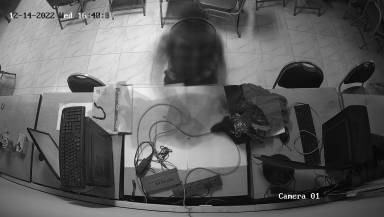

Image after NMF:


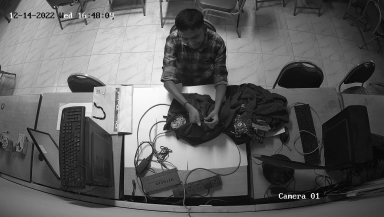

Image Before NMF:
-------------------------------Number of image: 1


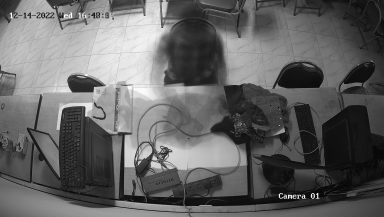

Image after NMF:


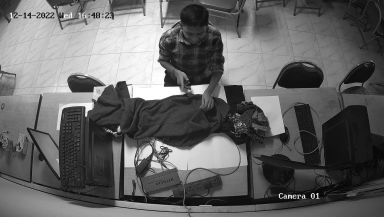

Image Before NMF:
-------------------------------Number of image: 2


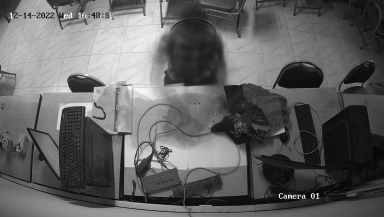

Image after NMF:


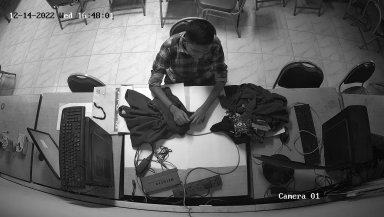

Image Before NMF:
-------------------------------Number of image: 3


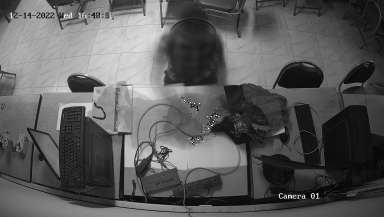

Image after NMF:


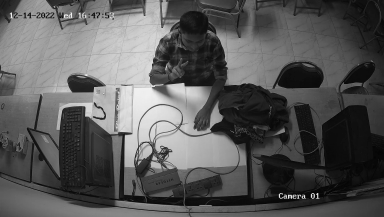

Image Before NMF:
-------------------------------Number of image: 4


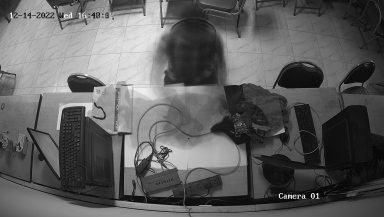

Image after NMF:


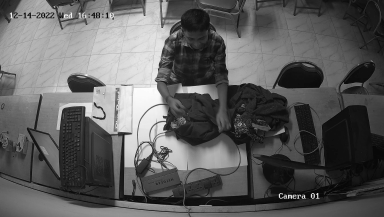

Image Before NMF:
-------------------------------Number of image: 5


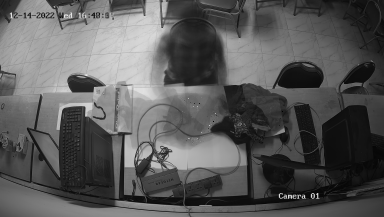

Image after NMF:


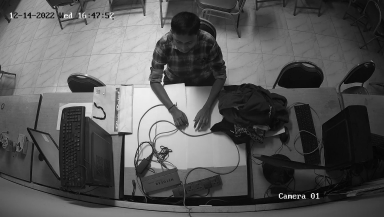

Image Before NMF:
-------------------------------Number of image: 6


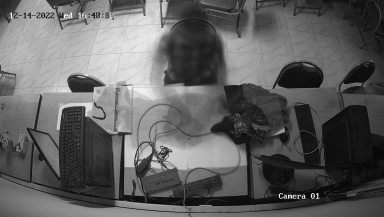

Image after NMF:


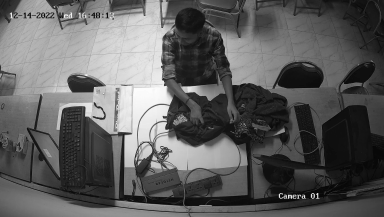

Image Before NMF:
-------------------------------Number of image: 7


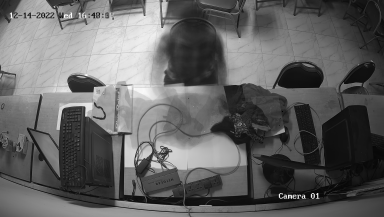

Image after NMF:


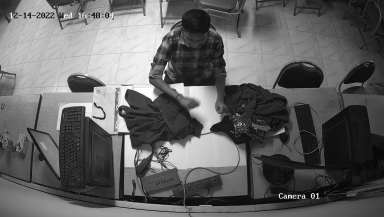

Image Before NMF:
-------------------------------Number of image: 8


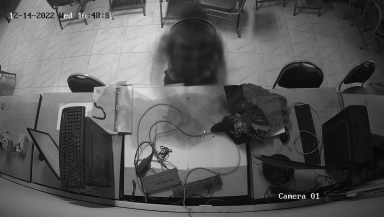

Image after NMF:


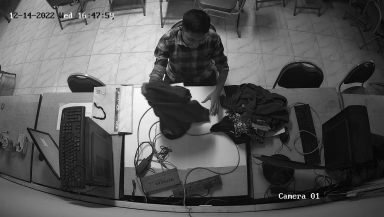

Image Before NMF:
-------------------------------Number of image: 9


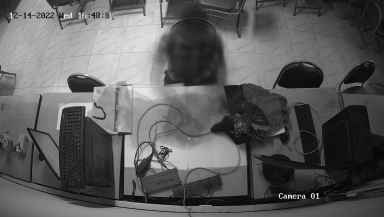

Image after NMF:


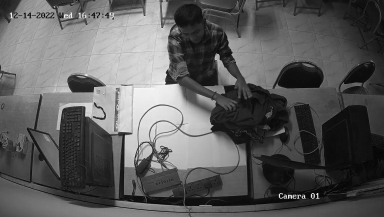

Image Before NMF:
-------------------------------Number of image: 10


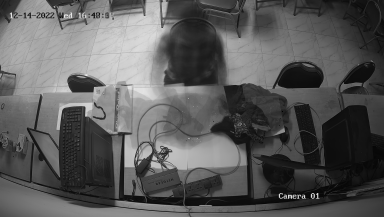

Image after NMF:


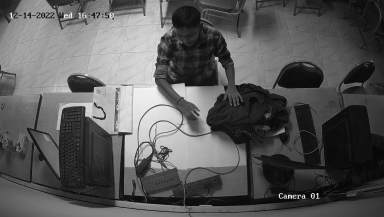

Image Before NMF:
-------------------------------Number of image: 11


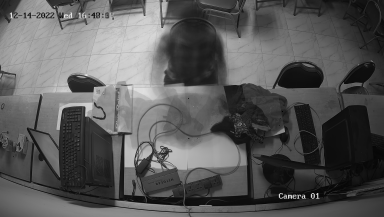

Image after NMF:


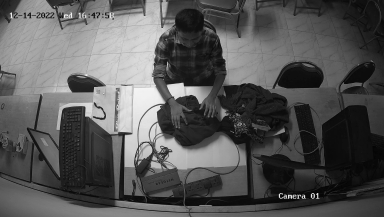

Image Before NMF:
-------------------------------Number of image: 12


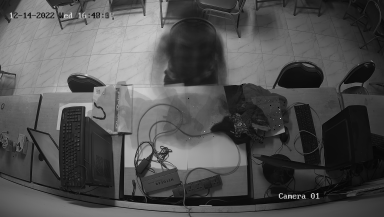

Image after NMF:


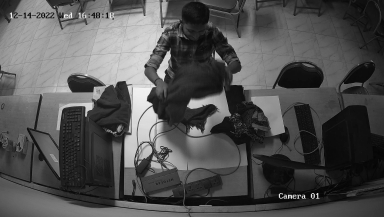

Image Before NMF:
-------------------------------Number of image: 13


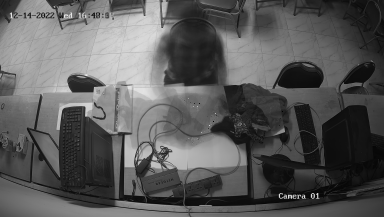

Image after NMF:


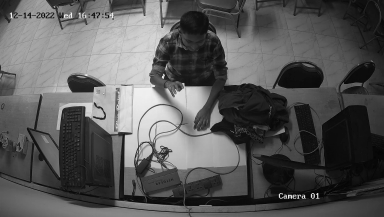

Image Before NMF:
-------------------------------Number of image: 14


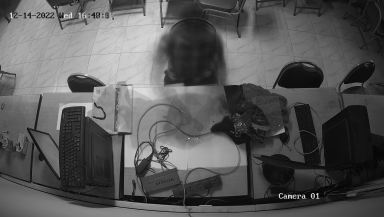

Image after NMF:


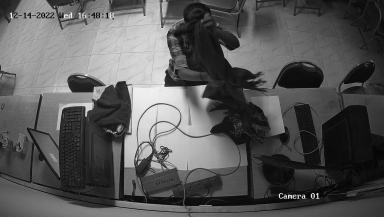

Image Before NMF:
-------------------------------Number of image: 15


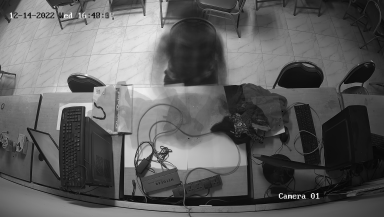

Image after NMF:


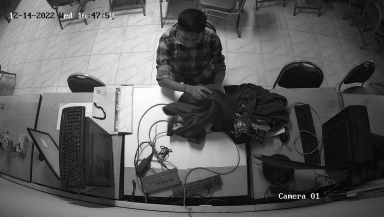

Image Before NMF:
-------------------------------Number of image: 16


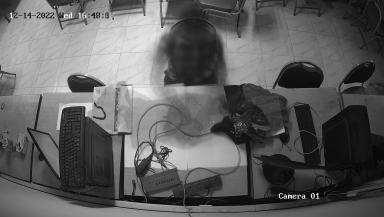

Image after NMF:


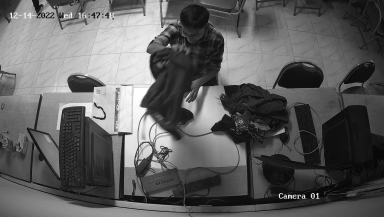

Image Before NMF:
-------------------------------Number of image: 17


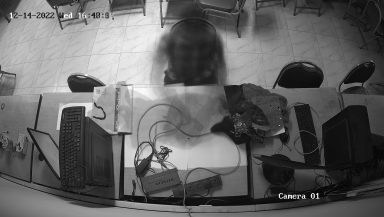

Image after NMF:


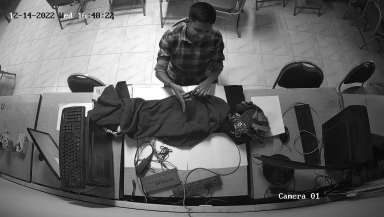

Image Before NMF:
-------------------------------Number of image: 18


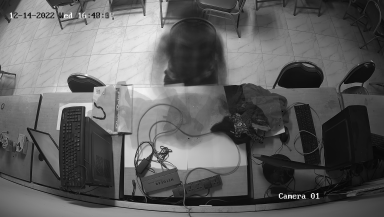

Image after NMF:


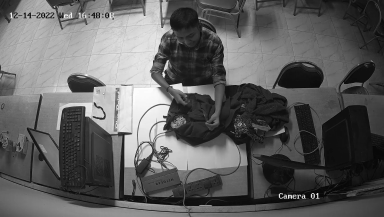

Image Before NMF:
-------------------------------Number of image: 19


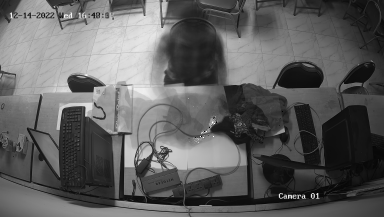

Image after NMF:


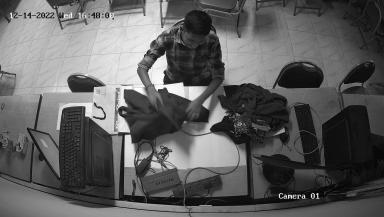

Image Before NMF:
-------------------------------Number of image: 20


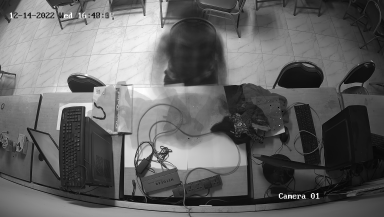

Image after NMF:


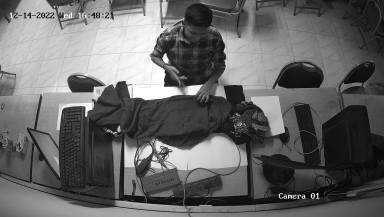

Image Before NMF:
-------------------------------Number of image: 21


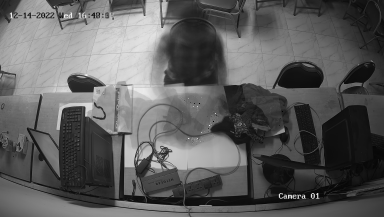

Image after NMF:


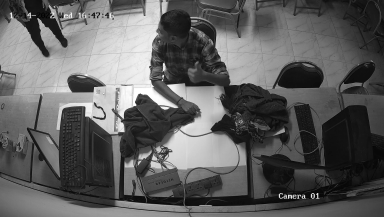

Image Before NMF:
-------------------------------Number of image: 22


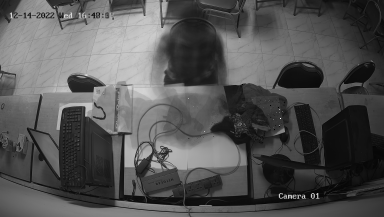

Image after NMF:


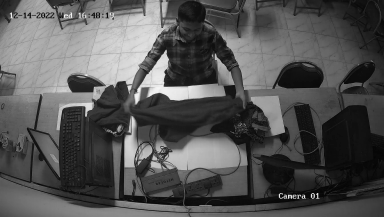

Image Before NMF:
-------------------------------Number of image: 23


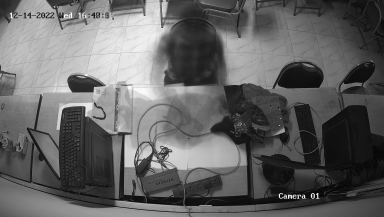

Image after NMF:


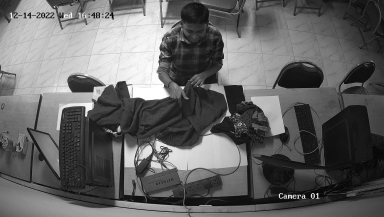

Image Before NMF:
-------------------------------Number of image: 24


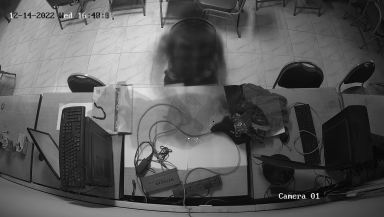

Image after NMF:


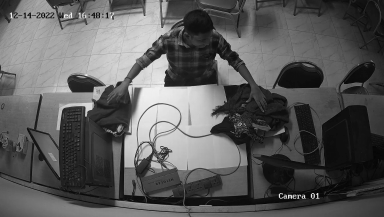

Image Before NMF:
-------------------------------Number of image: 25


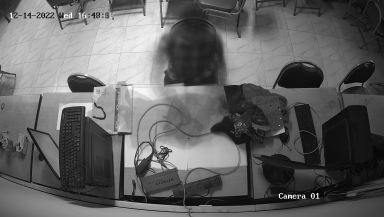

Image after NMF:


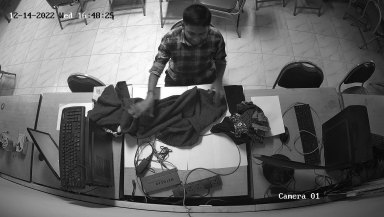

Image Before NMF:
-------------------------------Number of image: 26


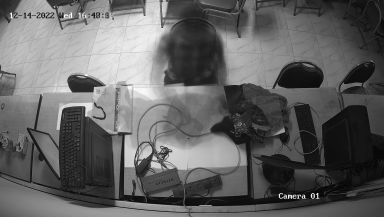

Image after NMF:


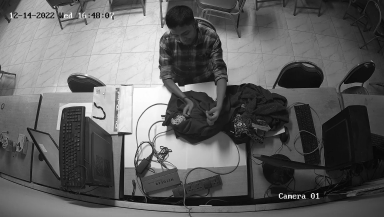

Image Before NMF:
-------------------------------Number of image: 27


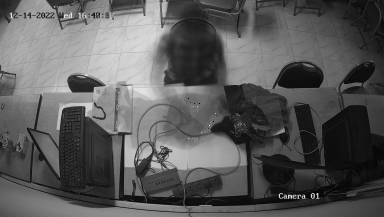

Image after NMF:


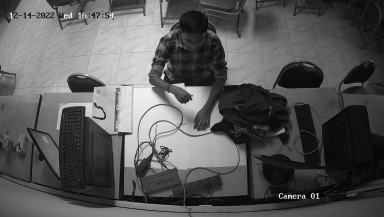

Image Before NMF:
-------------------------------Number of image: 28


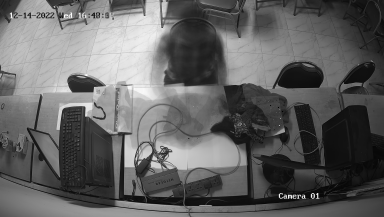

Image after NMF:


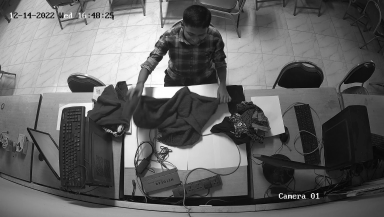

Image Before NMF:
-------------------------------Number of image: 29


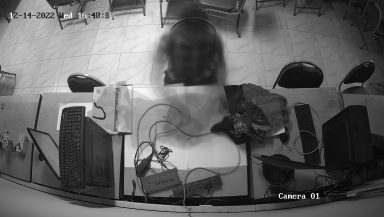

Image after NMF:


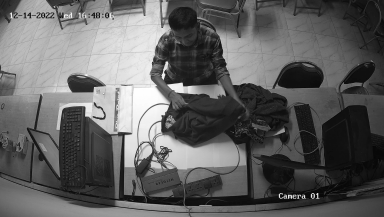

Image Before NMF:
-------------------------------Number of image: 30


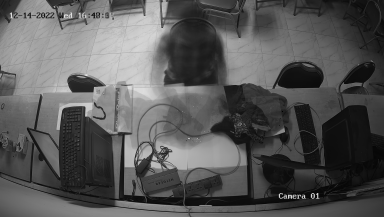

Image after NMF:


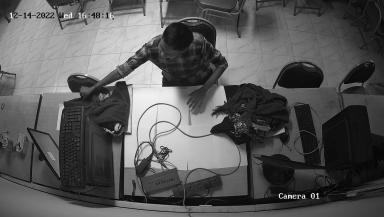

Image Before NMF:
-------------------------------Number of image: 31


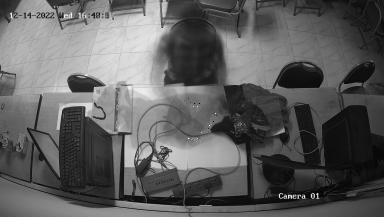

Image after NMF:


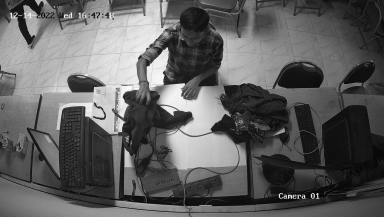

Image Before NMF:
-------------------------------Number of image: 32


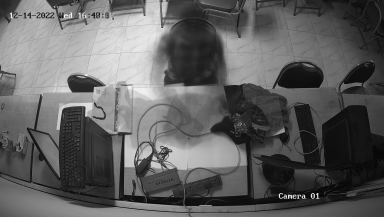

Image after NMF:


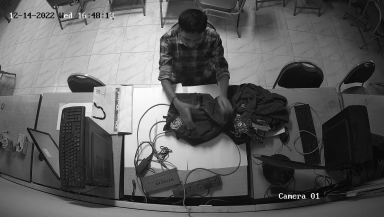

Image Before NMF:
-------------------------------Number of image: 33


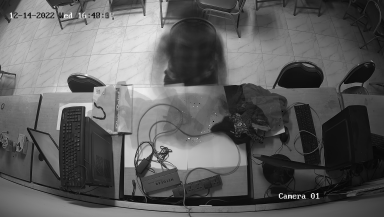

Image after NMF:


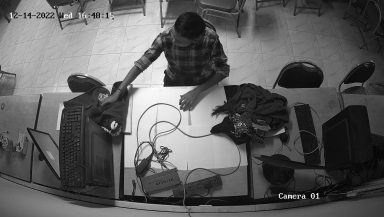

Image Before NMF:
-------------------------------Number of image: 34


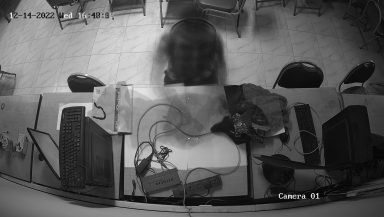

Image after NMF:


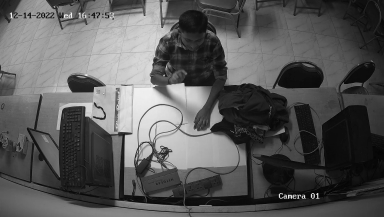

Image Before NMF:
-------------------------------Number of image: 35


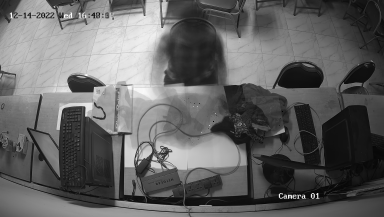

Image after NMF:


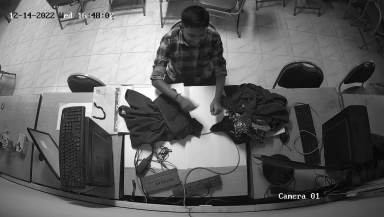

Image Before NMF:
-------------------------------Number of image: 36


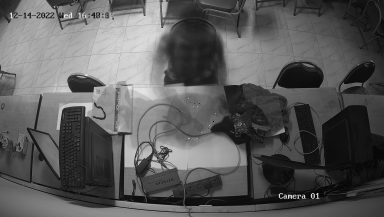

Image after NMF:


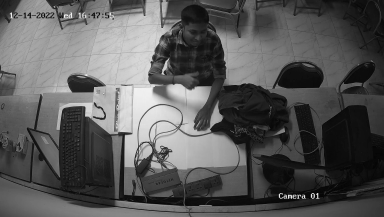

Image Before NMF:
-------------------------------Number of image: 37


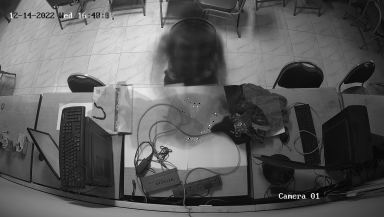

Image after NMF:


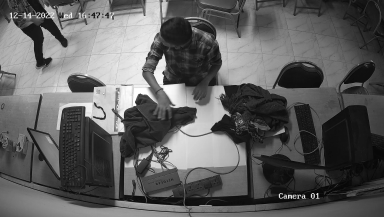

Image Before NMF:
-------------------------------Number of image: 38


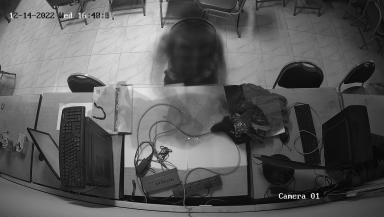

Image after NMF:


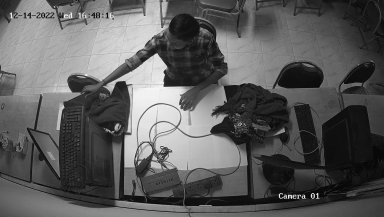

Image Before NMF:
-------------------------------Number of image: 39


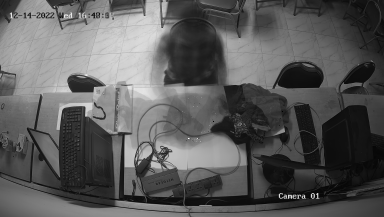

Image after NMF:


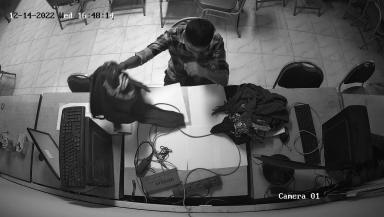

Image Before NMF:
-------------------------------Number of image: 40


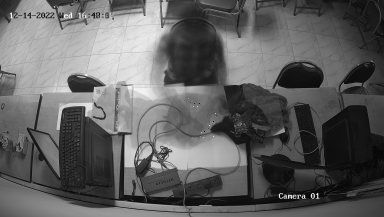

Image after NMF:


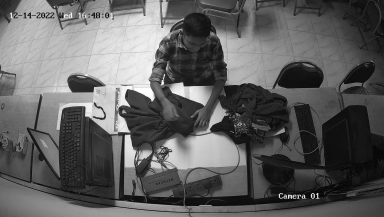

Image Before NMF:
-------------------------------Number of image: 41


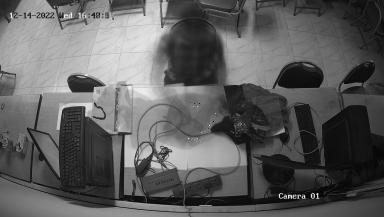

Image after NMF:


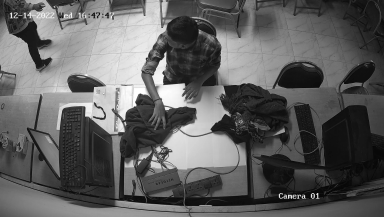

Image Before NMF:
-------------------------------Number of image: 42


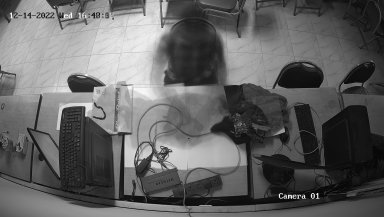

Image after NMF:


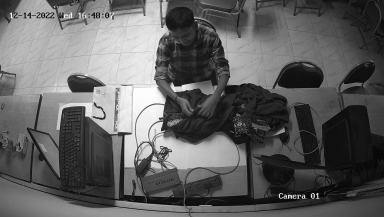

Image Before NMF:
-------------------------------Number of image: 43


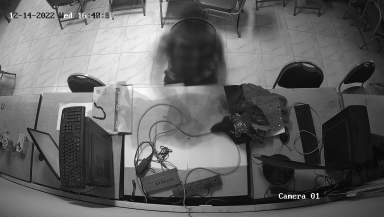

Image after NMF:


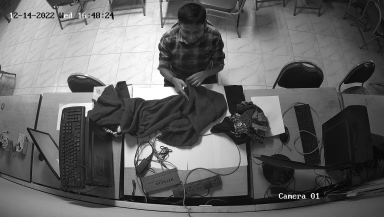

Image Before NMF:
-------------------------------Number of image: 44


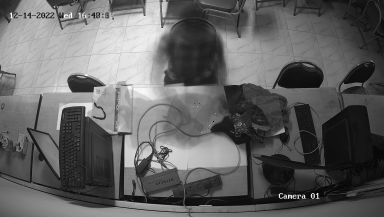

Image after NMF:


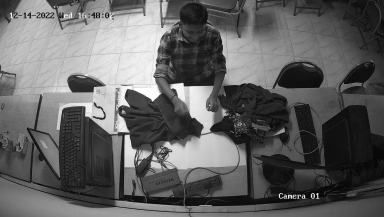

Image Before NMF:
-------------------------------Number of image: 45


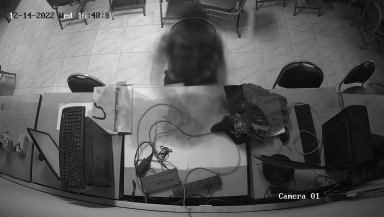

Image after NMF:


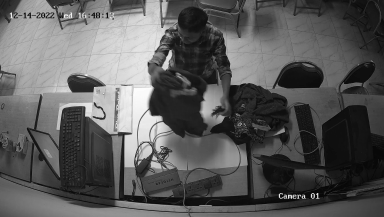

Image Before NMF:
-------------------------------Number of image: 46


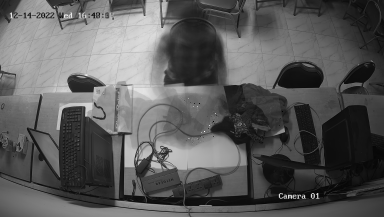

Image after NMF:


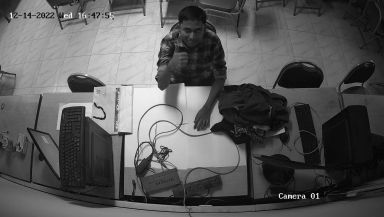

Image Before NMF:
-------------------------------Number of image: 47


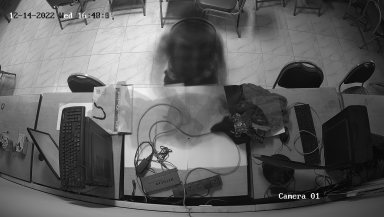

Image after NMF:


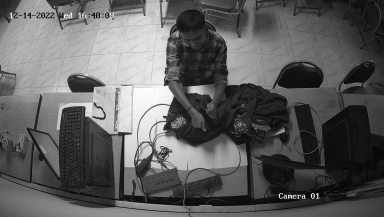

Image Before NMF:
-------------------------------Number of image: 48


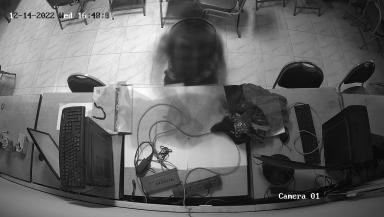

Image after NMF:


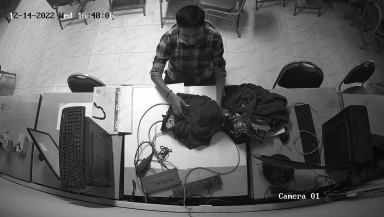

Image Before NMF:
-------------------------------Number of image: 49


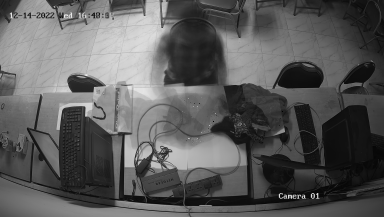

Image after NMF:


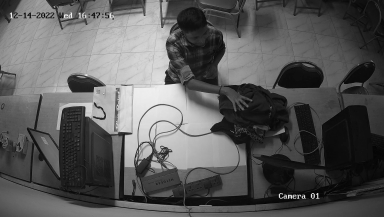

Image Before NMF:
-------------------------------Number of image: 50


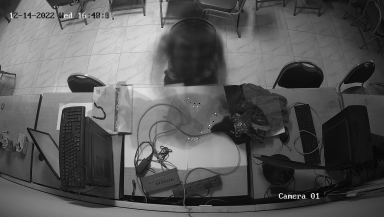

Image after NMF:


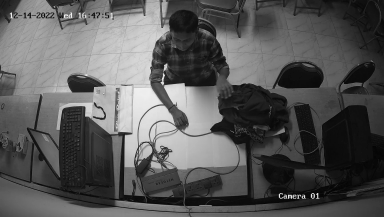

Image Before NMF:
-------------------------------Number of image: 51


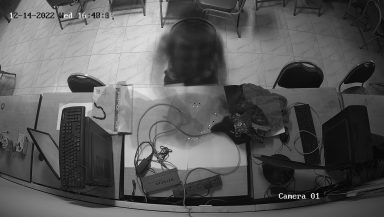

Image after NMF:


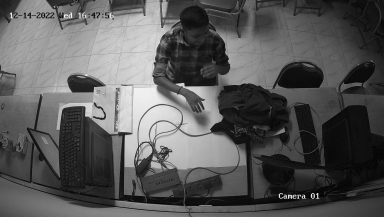

Image Before NMF:
-------------------------------Number of image: 52


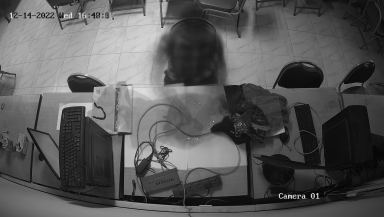

Image after NMF:


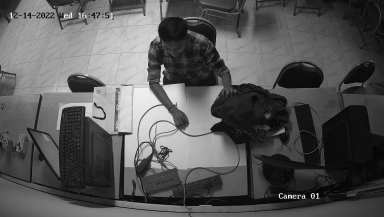

Image Before NMF:
-------------------------------Number of image: 53


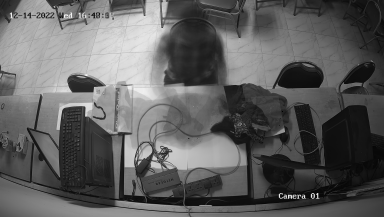

Image after NMF:


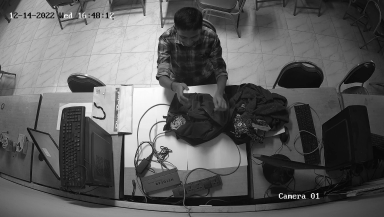

Image Before NMF:
-------------------------------Number of image: 54


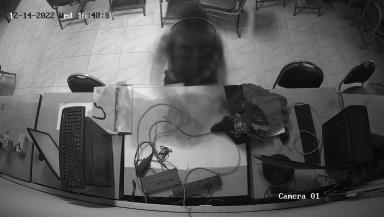

Image after NMF:


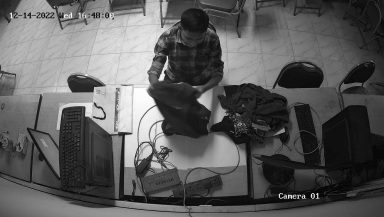

Image Before NMF:
-------------------------------Number of image: 55


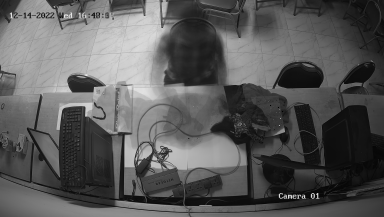

Image after NMF:


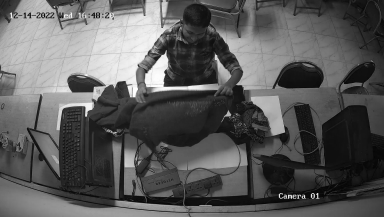

Image Before NMF:
-------------------------------Number of image: 56


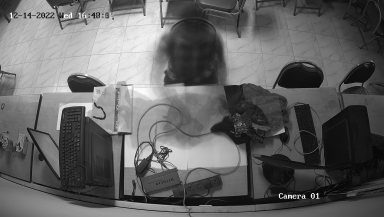

Image after NMF:


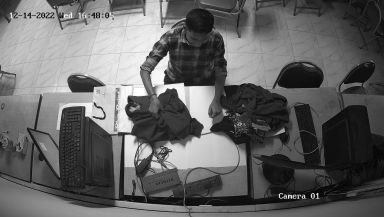

Image Before NMF:
-------------------------------Number of image: 57


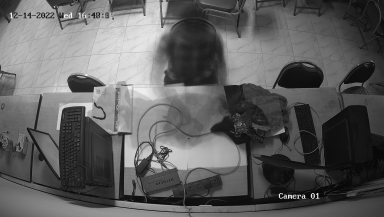

Image after NMF:


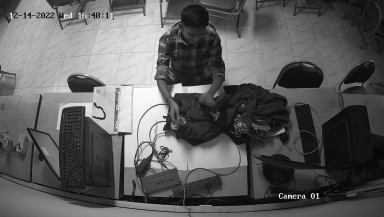

Image Before NMF:
-------------------------------Number of image: 58


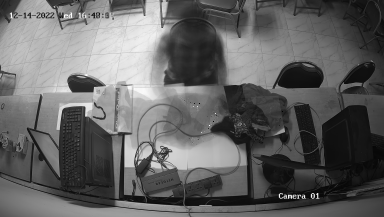

Image after NMF:


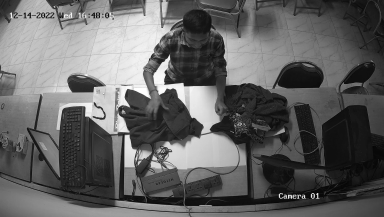

Image Before NMF:
-------------------------------Number of image: 59


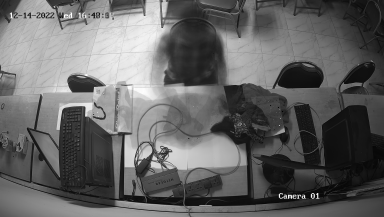

Image after NMF:


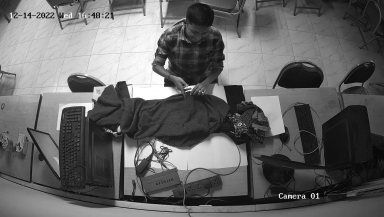

Image Before NMF:
-------------------------------Number of image: 60


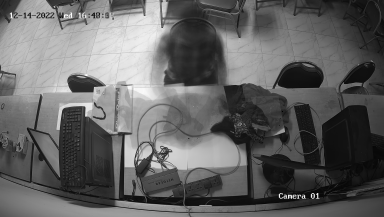

Image after NMF:


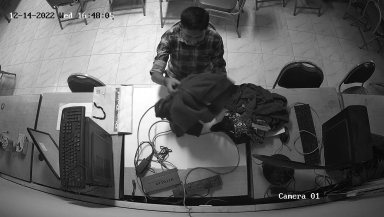

Image Before NMF:
-------------------------------Number of image: 61


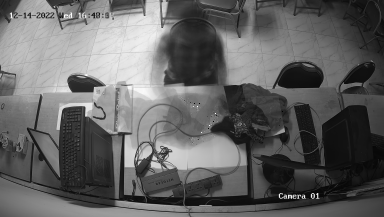

Image after NMF:


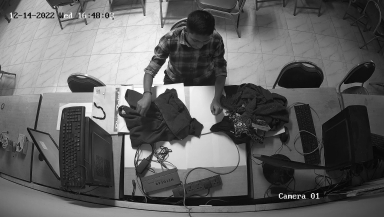

Image Before NMF:
-------------------------------Number of image: 62


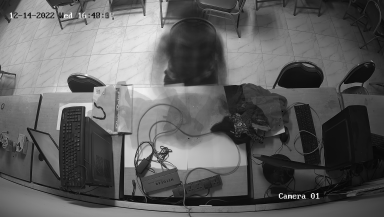

Image after NMF:


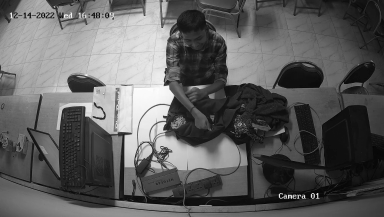

Image Before NMF:
-------------------------------Number of image: 63


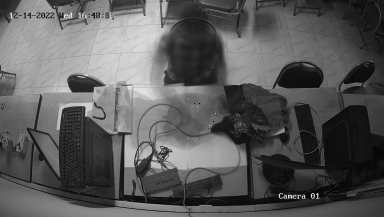

Image after NMF:


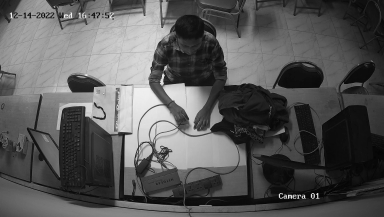

Image Before NMF:
-------------------------------Number of image: 64


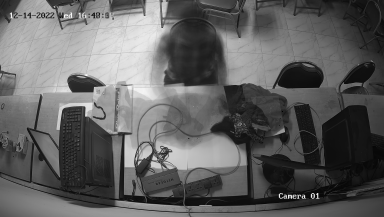

Image after NMF:


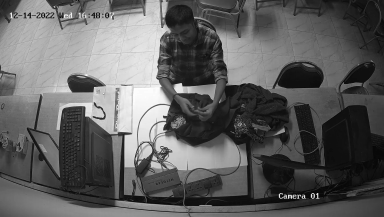

Image Before NMF:
-------------------------------Number of image: 65


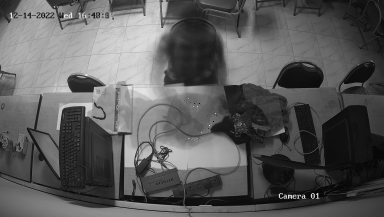

Image after NMF:


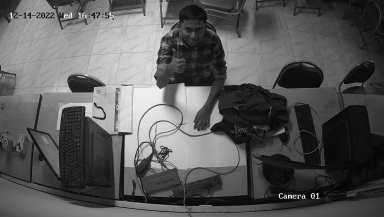

Image Before NMF:
-------------------------------Number of image: 66


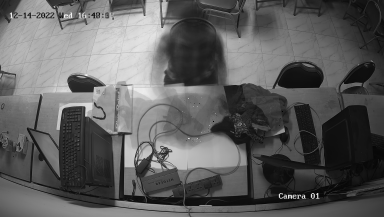

Image after NMF:


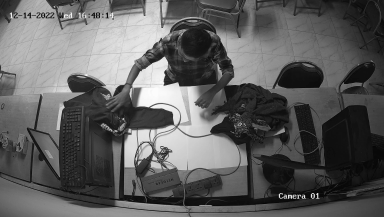

Image Before NMF:
-------------------------------Number of image: 67


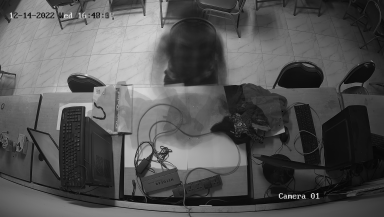

Image after NMF:


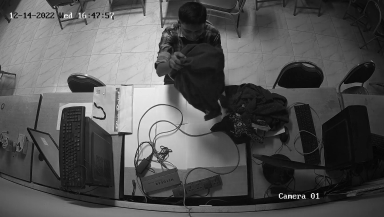

Image Before NMF:
-------------------------------Number of image: 68


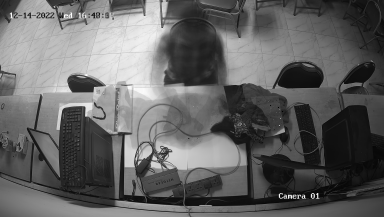

Image after NMF:


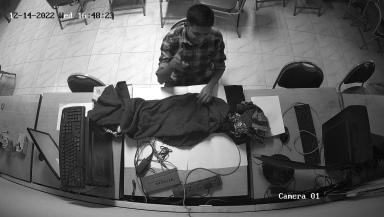

Image Before NMF:
-------------------------------Number of image: 69


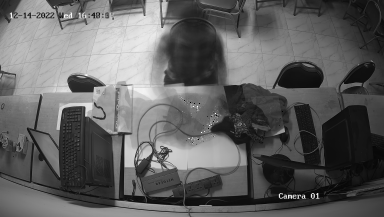

Image after NMF:


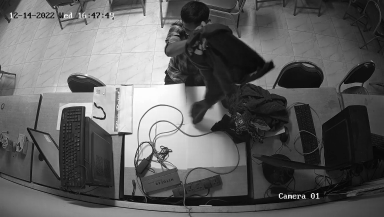

Image Before NMF:
-------------------------------Number of image: 70


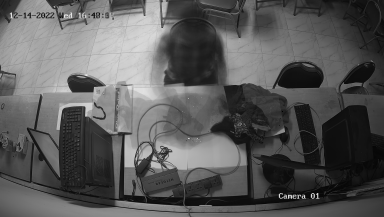

Image after NMF:


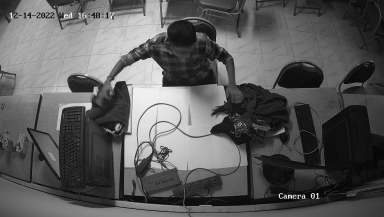

Image Before NMF:
-------------------------------Number of image: 71


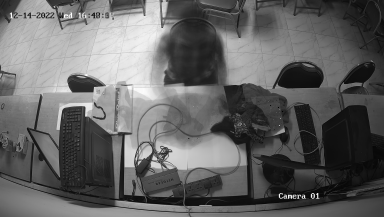

Image after NMF:


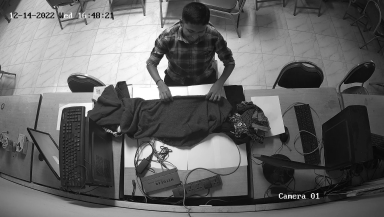

Image Before NMF:
-------------------------------Number of image: 72


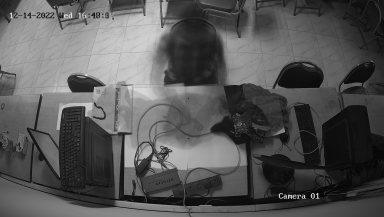

Image after NMF:


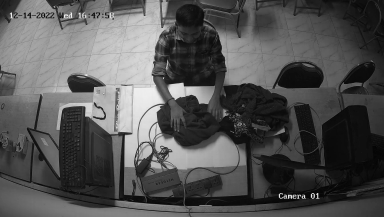

Image Before NMF:
-------------------------------Number of image: 73


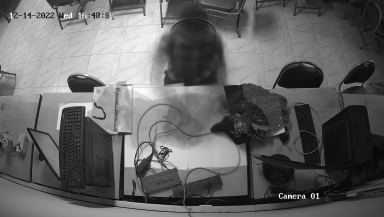

Image after NMF:


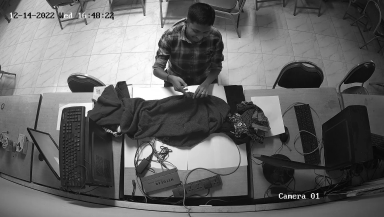

Image Before NMF:
-------------------------------Number of image: 74


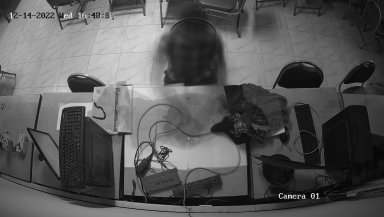

Image after NMF:


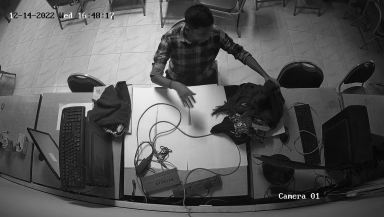

Image Before NMF:
-------------------------------Number of image: 75


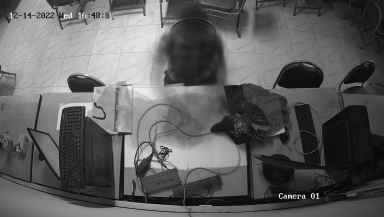

Image after NMF:


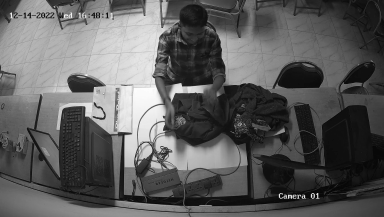

Image Before NMF:
-------------------------------Number of image: 76


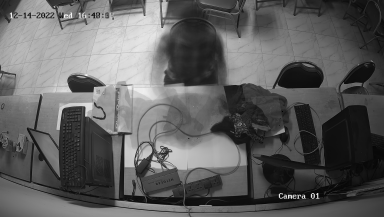

Image after NMF:


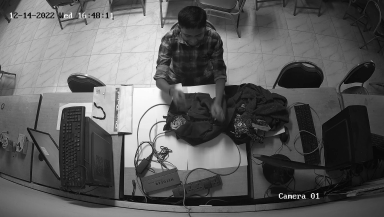

Image Before NMF:
-------------------------------Number of image: 77


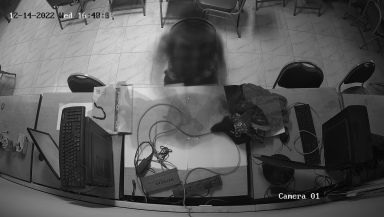

Image after NMF:


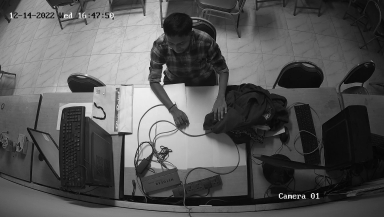

Image Before NMF:
-------------------------------Number of image: 78


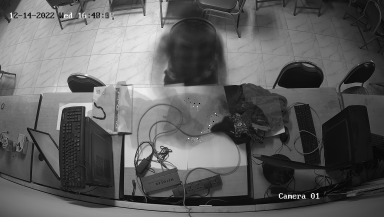

Image after NMF:


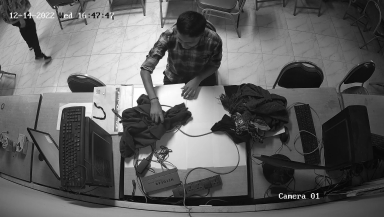

Image Before NMF:
-------------------------------Number of image: 79


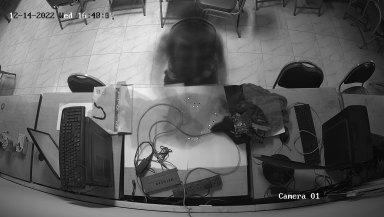

Image after NMF:


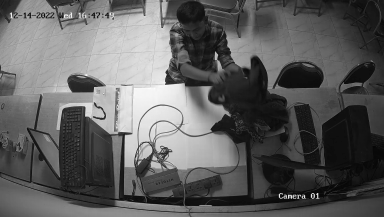

Image Before NMF:
-------------------------------Number of image: 80


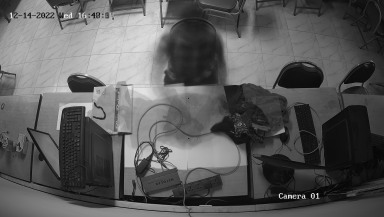

Image after NMF:


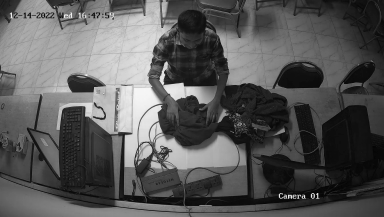

Image Before NMF:
-------------------------------Number of image: 81


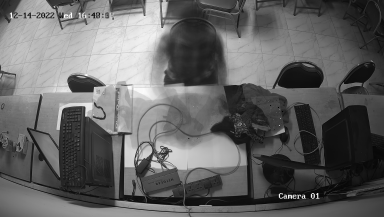

Image after NMF:


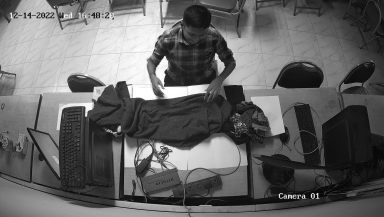

Image Before NMF:
-------------------------------Number of image: 82


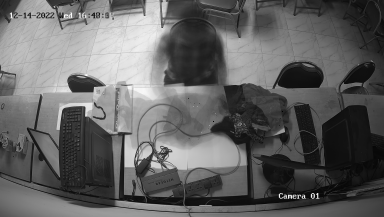

Image after NMF:


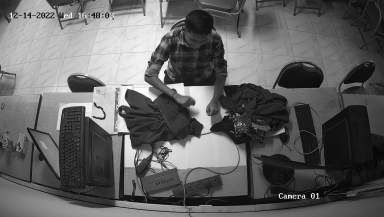

Image Before NMF:
-------------------------------Number of image: 83


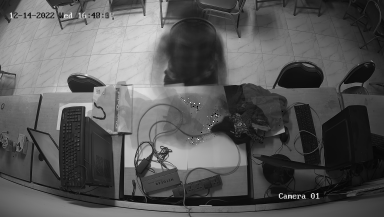

Image after NMF:


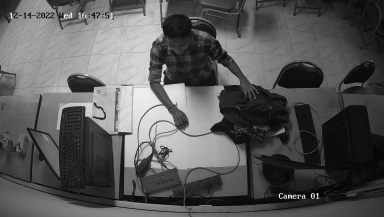

Image Before NMF:
-------------------------------Number of image: 84


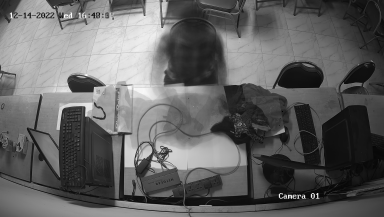

Image after NMF:


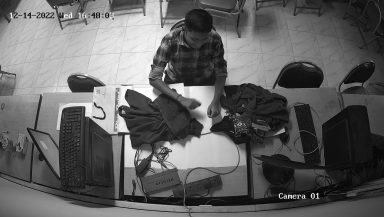

Image Before NMF:
-------------------------------Number of image: 85


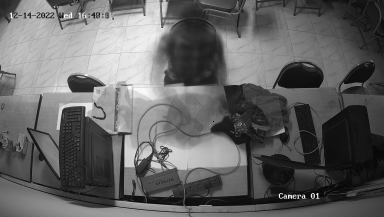

Image after NMF:


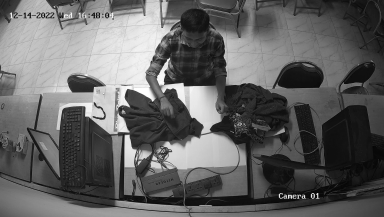

Image Before NMF:
-------------------------------Number of image: 86


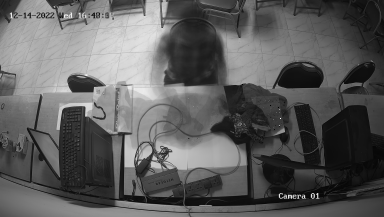

Image after NMF:


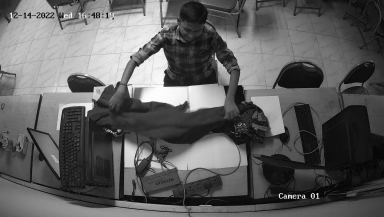

Image Before NMF:
-------------------------------Number of image: 87


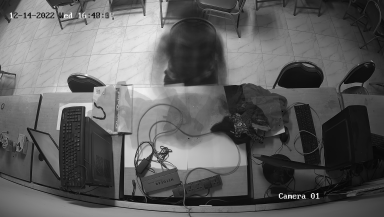

Image after NMF:


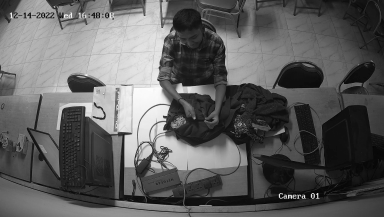

Image Before NMF:
-------------------------------Number of image: 88


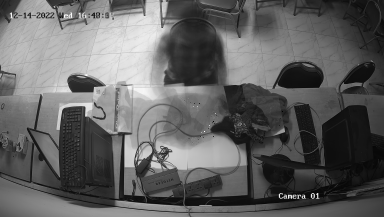

Image after NMF:


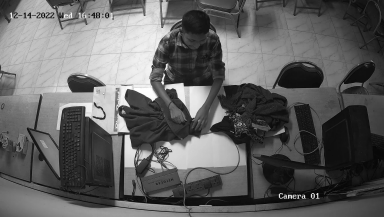

Image Before NMF:
-------------------------------Number of image: 89


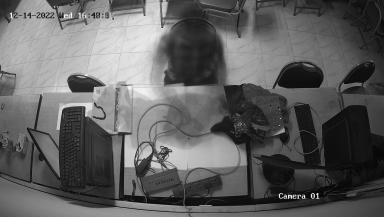

Image after NMF:


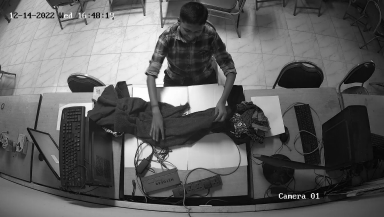

Image Before NMF:
-------------------------------Number of image: 90


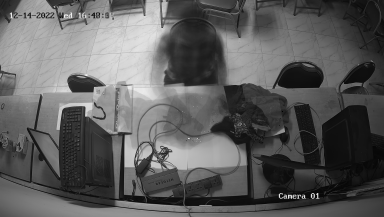

Image after NMF:


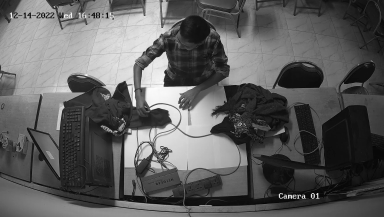

Image Before NMF:
-------------------------------Number of image: 91


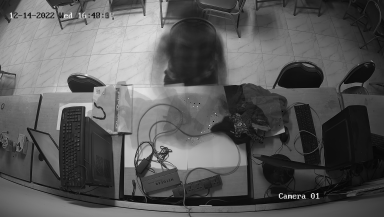

Image after NMF:


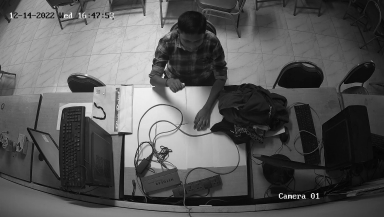

Image Before NMF:
-------------------------------Number of image: 92


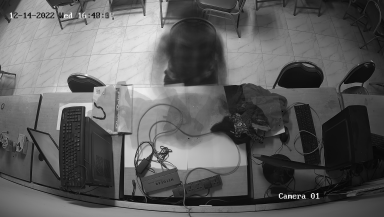

Image after NMF:


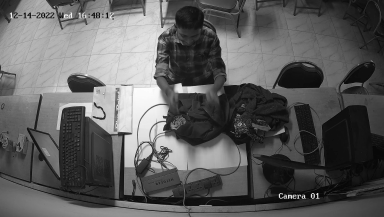

Image Before NMF:
-------------------------------Number of image: 93


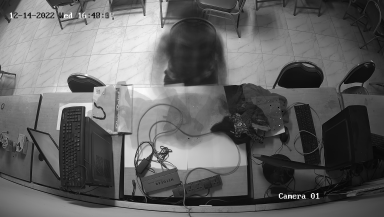

Image after NMF:


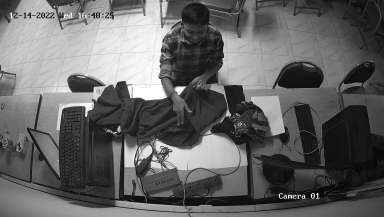

Image Before NMF:
-------------------------------Number of image: 94


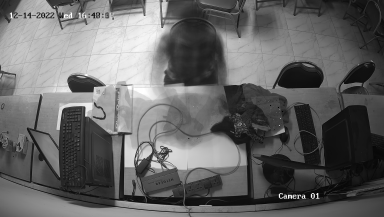

Image after NMF:


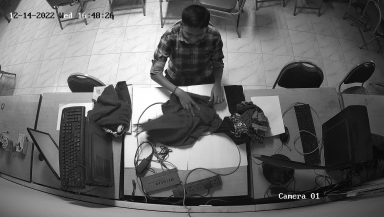

Image Before NMF:
-------------------------------Number of image: 95


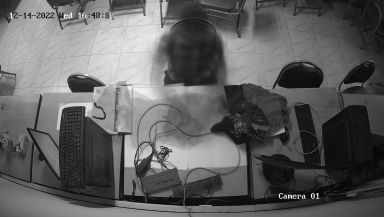

Image after NMF:


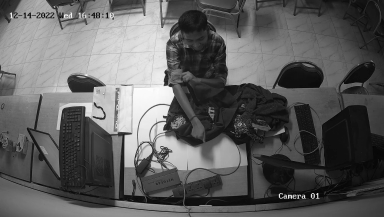

Image Before NMF:
-------------------------------Number of image: 96


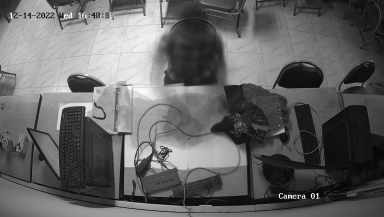

Image after NMF:


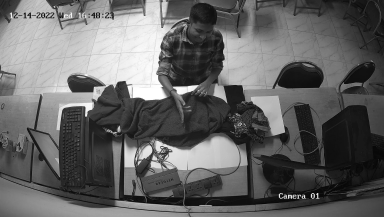

Image Before NMF:
-------------------------------Number of image: 97


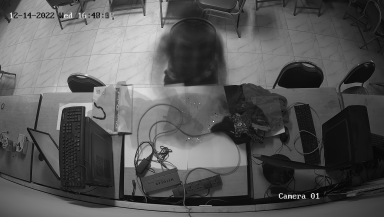

Image after NMF:


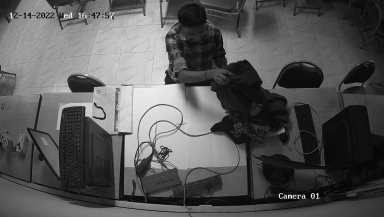

Image Before NMF:
-------------------------------Number of image: 98


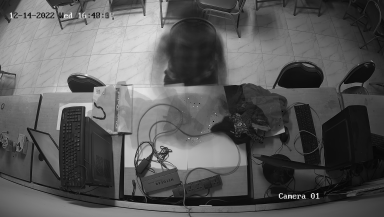

Image after NMF:


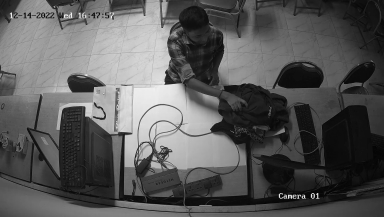

Image Before NMF:
-------------------------------Number of image: 99


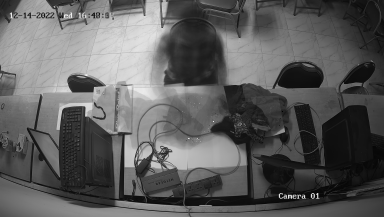

Image after NMF:


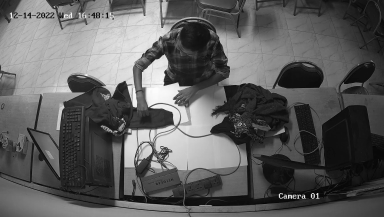

Image Before NMF:


In [ ]:
compareAndTest(m,w,h, mean)

In [ ]:
x_new=np.matmul(w,h)
x_new=np.ceil(x_new*mean)
x_new=np.transpose(x_new)

print("Original Image Set Variance: "+str(variance(np.ceil(np.transpose(m)*mean))))
print("NMF Generated Image Set Variance: "+str(variance(x_new)))

Original Image Set Variance: 4066.2712745431168
NMF Generated Image Set Variance: 3425.761853415184


In [ ]:
w.shape

(100, 10)

# Clustering

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


----------------Labels------------------------
-------------------------------Number of image: 0-----------Cluster=0.


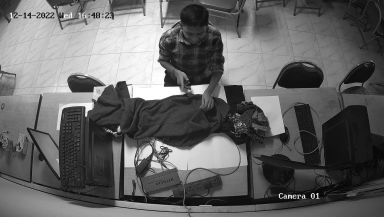

-------------------------------Number of image: 1-----------Cluster=0.


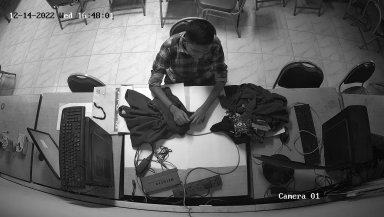

-------------------------------Number of image: 2-----------Cluster=0.


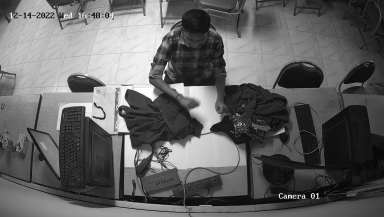

-------------------------------Number of image: 3-----------Cluster=0.


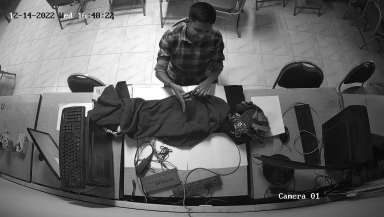

-------------------------------Number of image: 4-----------Cluster=0.


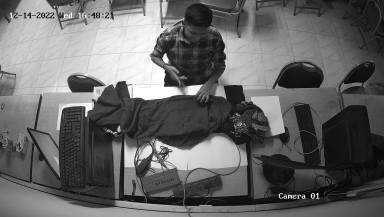

-------------------------------Number of image: 5-----------Cluster=0.


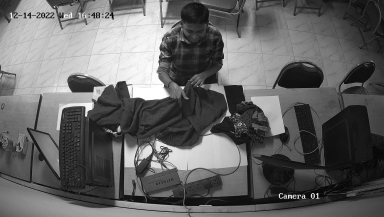

-------------------------------Number of image: 6-----------Cluster=0.


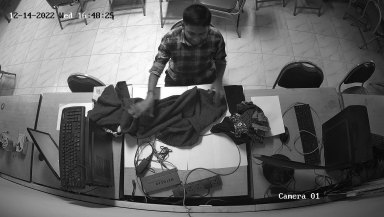

-------------------------------Number of image: 7-----------Cluster=0.


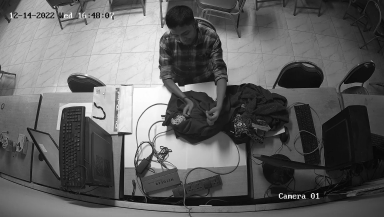

-------------------------------Number of image: 8-----------Cluster=0.


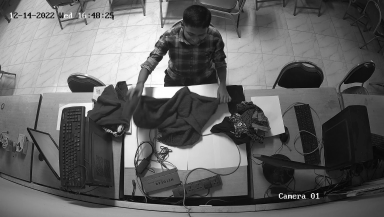

-------------------------------Number of image: 9-----------Cluster=0.


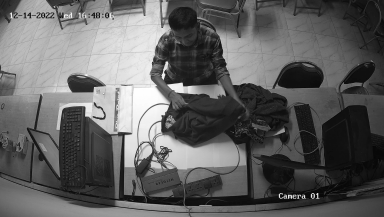

-------------------------------Number of image: 10-----------Cluster=0.


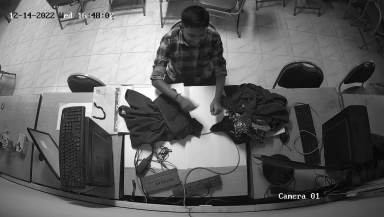

-------------------------------Number of image: 11-----------Cluster=0.


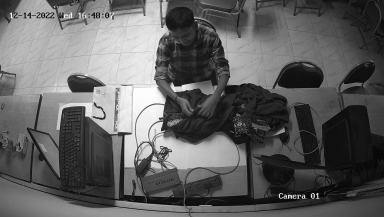

-------------------------------Number of image: 12-----------Cluster=0.


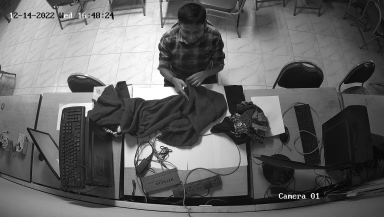

-------------------------------Number of image: 13-----------Cluster=0.


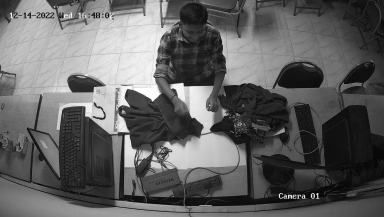

-------------------------------Number of image: 14-----------Cluster=0.


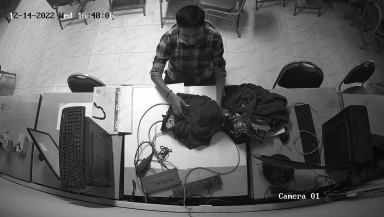

-------------------------------Number of image: 15-----------Cluster=0.


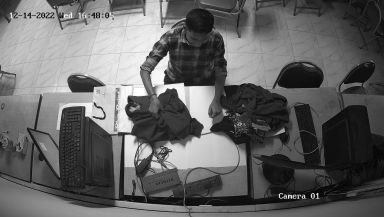

-------------------------------Number of image: 16-----------Cluster=0.


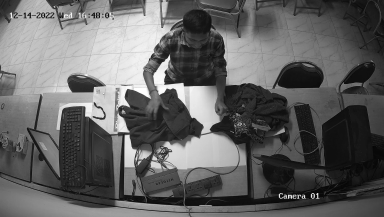

-------------------------------Number of image: 17-----------Cluster=0.


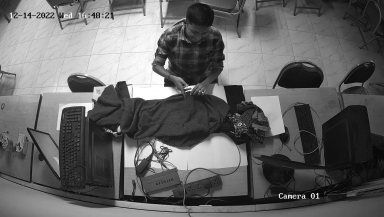

-------------------------------Number of image: 18-----------Cluster=0.


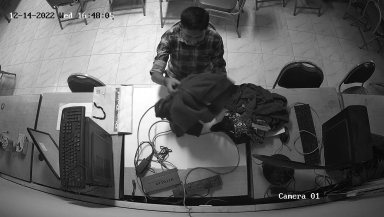

-------------------------------Number of image: 19-----------Cluster=0.


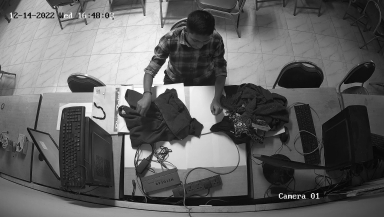

-------------------------------Number of image: 20-----------Cluster=0.


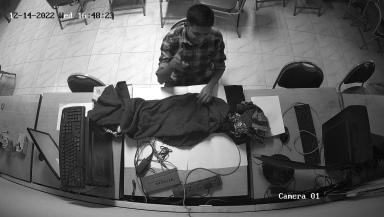

-------------------------------Number of image: 21-----------Cluster=0.


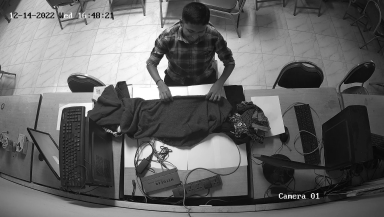

-------------------------------Number of image: 22-----------Cluster=0.


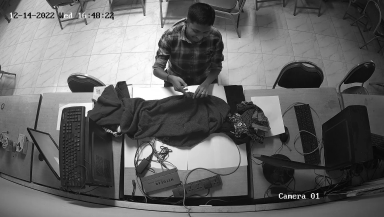

-------------------------------Number of image: 23-----------Cluster=0.


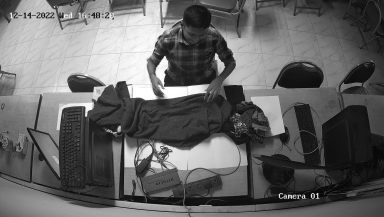

-------------------------------Number of image: 24-----------Cluster=0.


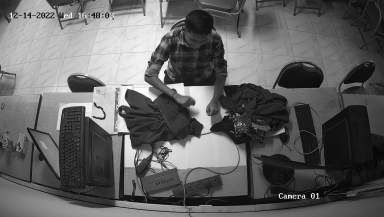

-------------------------------Number of image: 25-----------Cluster=0.


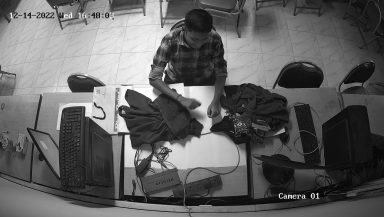

-------------------------------Number of image: 26-----------Cluster=0.


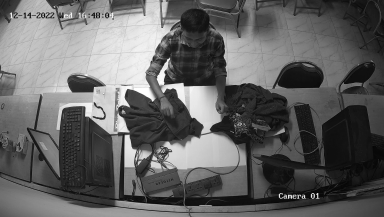

-------------------------------Number of image: 27-----------Cluster=0.


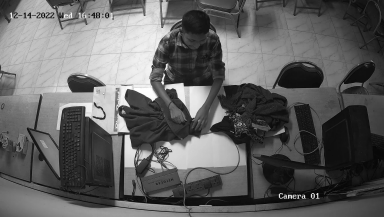

-------------------------------Number of image: 28-----------Cluster=0.


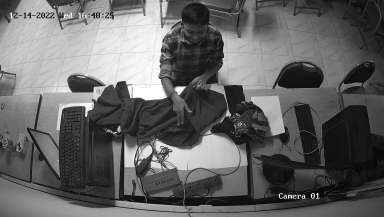

-------------------------------Number of image: 29-----------Cluster=0.


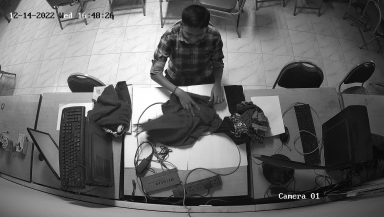

-------------------------------Number of image: 30-----------Cluster=0.


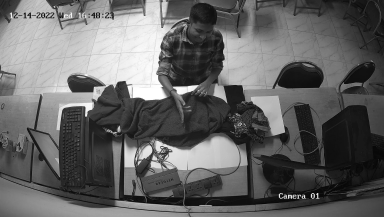

----------------Labels------------------------
-------------------------------Number of image: 0-----------Cluster=1.


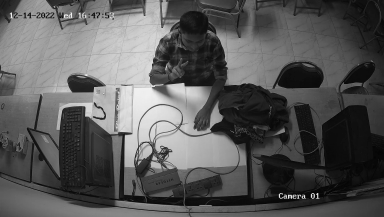

-------------------------------Number of image: 1-----------Cluster=1.


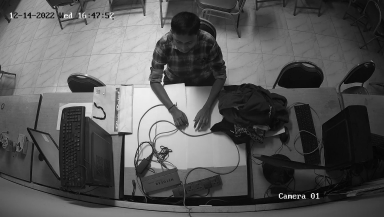

-------------------------------Number of image: 2-----------Cluster=1.


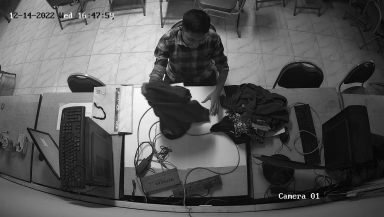

-------------------------------Number of image: 3-----------Cluster=1.


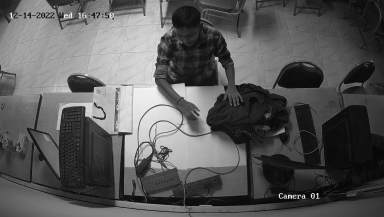

-------------------------------Number of image: 4-----------Cluster=1.


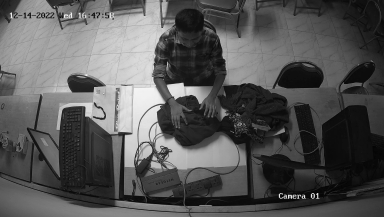

-------------------------------Number of image: 5-----------Cluster=1.


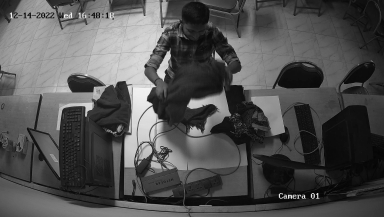

-------------------------------Number of image: 6-----------Cluster=1.


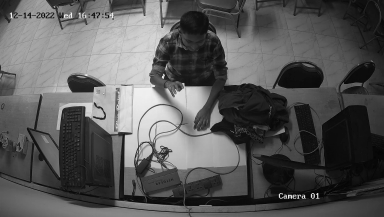

-------------------------------Number of image: 7-----------Cluster=1.


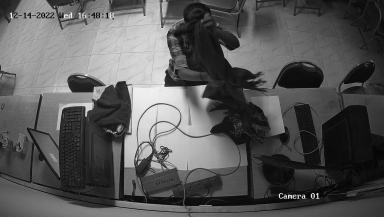

-------------------------------Number of image: 8-----------Cluster=1.


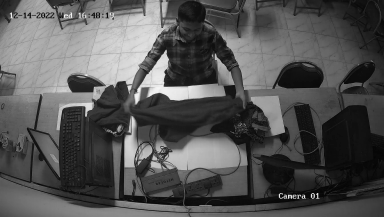

-------------------------------Number of image: 9-----------Cluster=1.


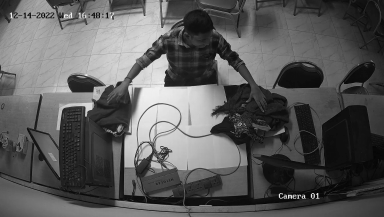

-------------------------------Number of image: 10-----------Cluster=1.


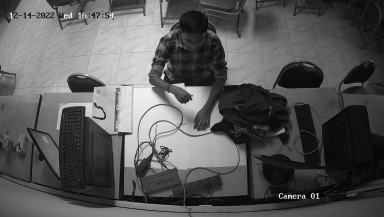

-------------------------------Number of image: 11-----------Cluster=1.


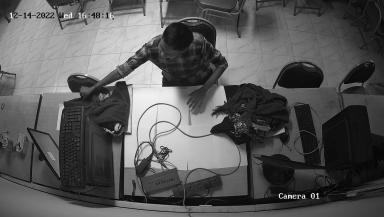

-------------------------------Number of image: 12-----------Cluster=1.


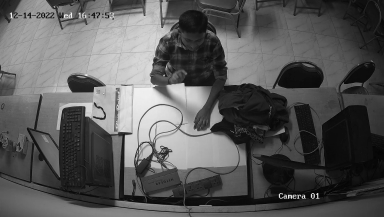

-------------------------------Number of image: 13-----------Cluster=1.


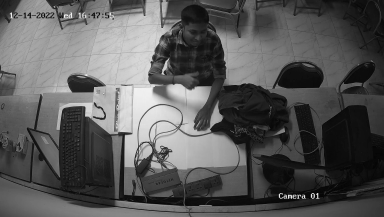

-------------------------------Number of image: 14-----------Cluster=1.


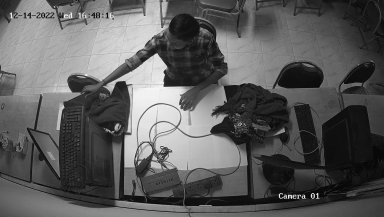

-------------------------------Number of image: 15-----------Cluster=1.


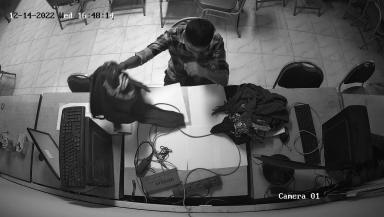

-------------------------------Number of image: 16-----------Cluster=1.


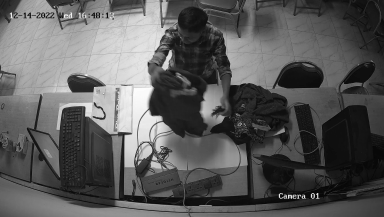

-------------------------------Number of image: 17-----------Cluster=1.


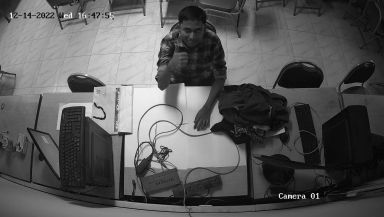

-------------------------------Number of image: 18-----------Cluster=1.


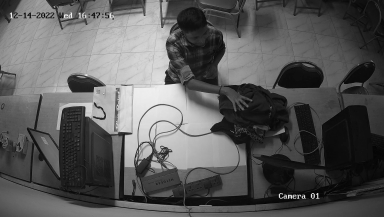

-------------------------------Number of image: 19-----------Cluster=1.


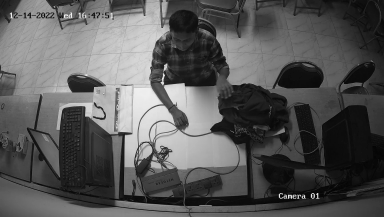

-------------------------------Number of image: 20-----------Cluster=1.


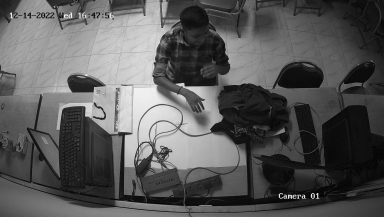

-------------------------------Number of image: 21-----------Cluster=1.


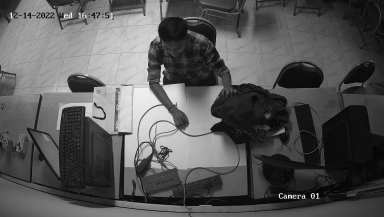

-------------------------------Number of image: 22-----------Cluster=1.


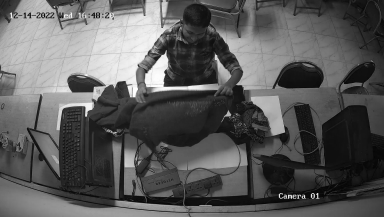

-------------------------------Number of image: 23-----------Cluster=1.


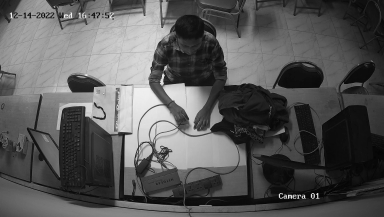

-------------------------------Number of image: 24-----------Cluster=1.


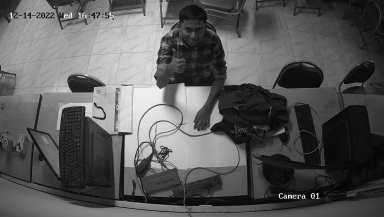

-------------------------------Number of image: 25-----------Cluster=1.


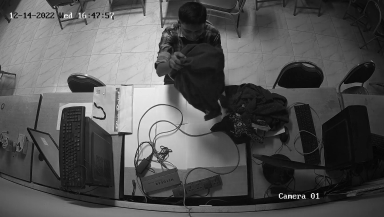

-------------------------------Number of image: 26-----------Cluster=1.


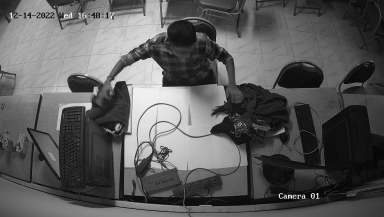

-------------------------------Number of image: 27-----------Cluster=1.


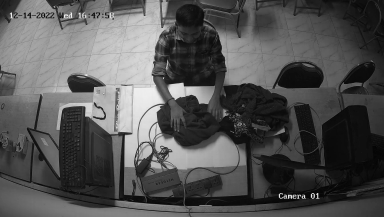

-------------------------------Number of image: 28-----------Cluster=1.


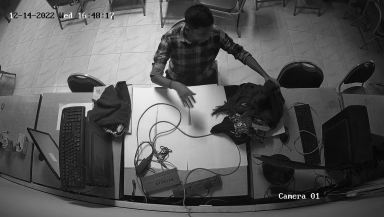

-------------------------------Number of image: 29-----------Cluster=1.


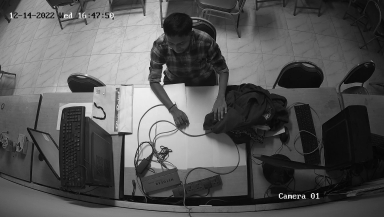

-------------------------------Number of image: 30-----------Cluster=1.


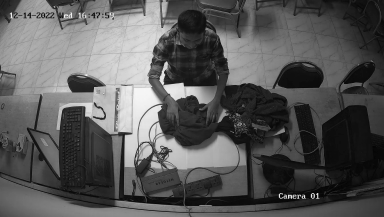

-------------------------------Number of image: 31-----------Cluster=1.


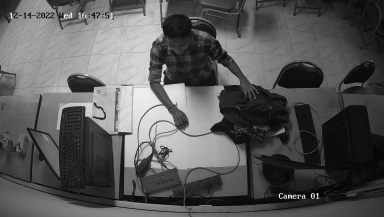

-------------------------------Number of image: 32-----------Cluster=1.


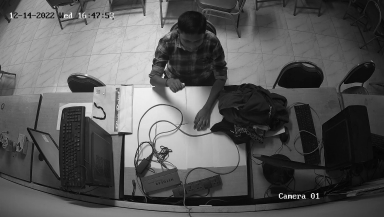

-------------------------------Number of image: 33-----------Cluster=1.


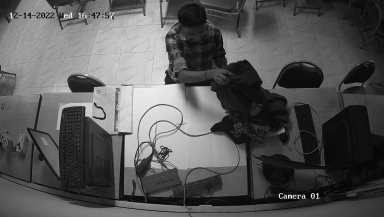

-------------------------------Number of image: 34-----------Cluster=1.


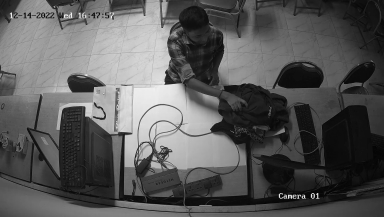

----------------Labels------------------------
-------------------------------Number of image: 0-----------Cluster=2.


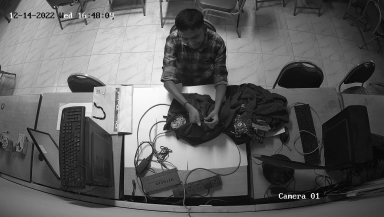

-------------------------------Number of image: 1-----------Cluster=2.


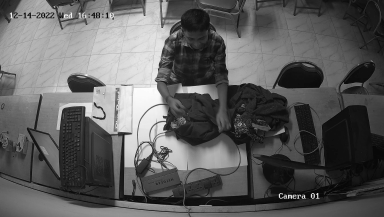

-------------------------------Number of image: 2-----------Cluster=2.


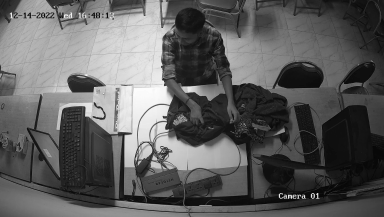

-------------------------------Number of image: 3-----------Cluster=2.


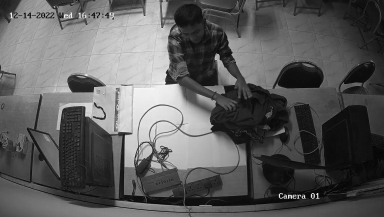

-------------------------------Number of image: 4-----------Cluster=2.


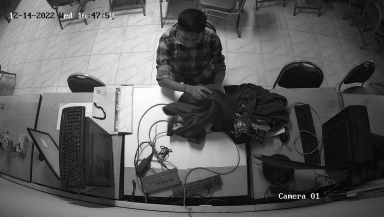

-------------------------------Number of image: 5-----------Cluster=2.


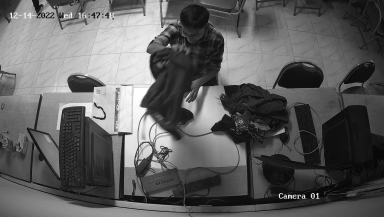

-------------------------------Number of image: 6-----------Cluster=2.


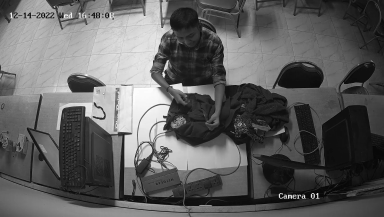

-------------------------------Number of image: 7-----------Cluster=2.


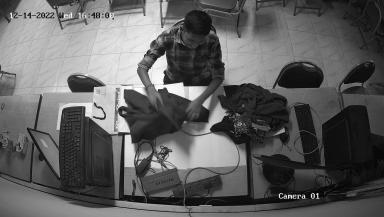

-------------------------------Number of image: 8-----------Cluster=2.


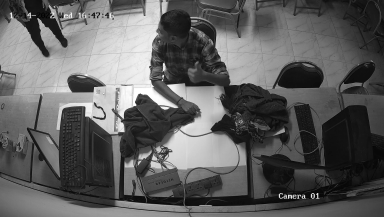

-------------------------------Number of image: 9-----------Cluster=2.


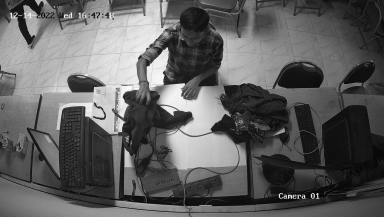

-------------------------------Number of image: 10-----------Cluster=2.


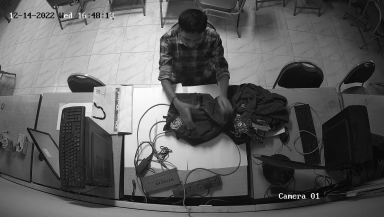

-------------------------------Number of image: 11-----------Cluster=2.


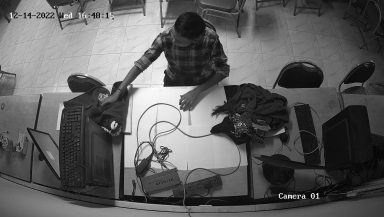

-------------------------------Number of image: 12-----------Cluster=2.


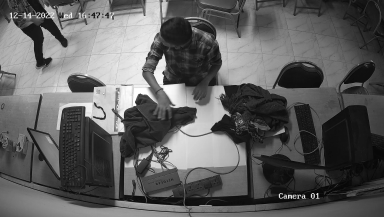

-------------------------------Number of image: 13-----------Cluster=2.


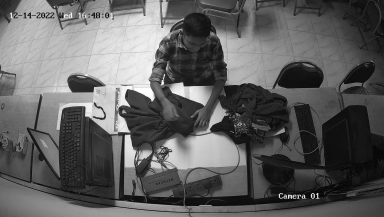

-------------------------------Number of image: 14-----------Cluster=2.


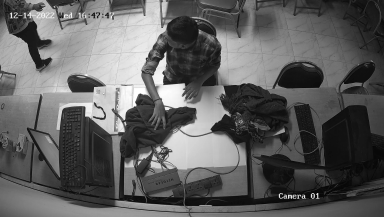

-------------------------------Number of image: 15-----------Cluster=2.


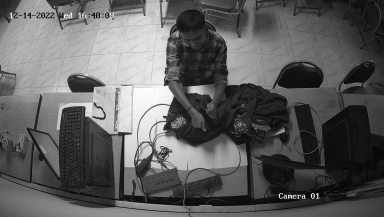

-------------------------------Number of image: 16-----------Cluster=2.


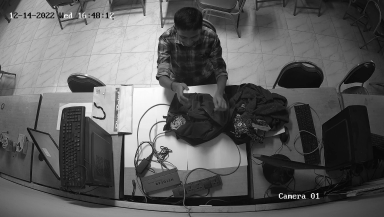

-------------------------------Number of image: 17-----------Cluster=2.


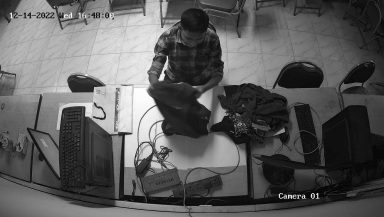

-------------------------------Number of image: 18-----------Cluster=2.


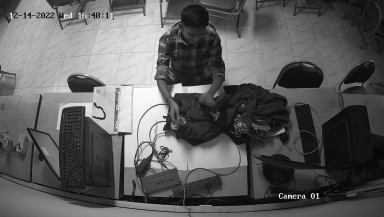

-------------------------------Number of image: 19-----------Cluster=2.


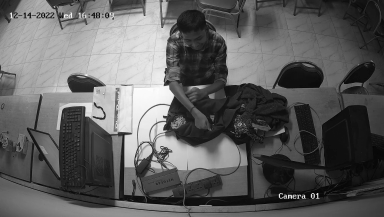

-------------------------------Number of image: 20-----------Cluster=2.


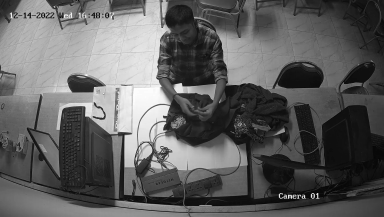

-------------------------------Number of image: 21-----------Cluster=2.


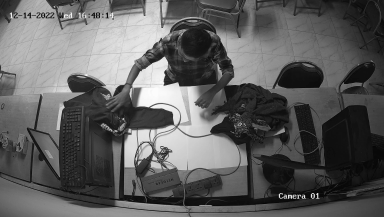

-------------------------------Number of image: 22-----------Cluster=2.


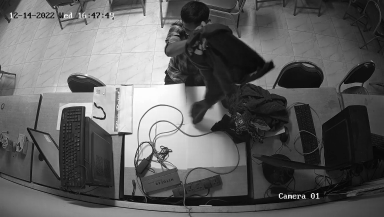

-------------------------------Number of image: 23-----------Cluster=2.


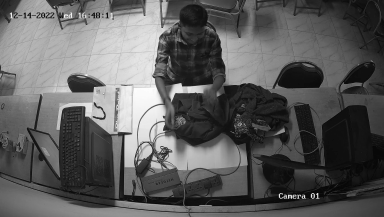

-------------------------------Number of image: 24-----------Cluster=2.


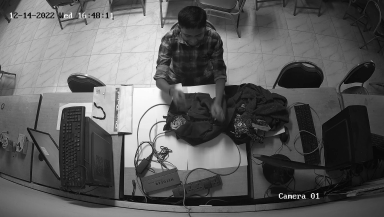

-------------------------------Number of image: 25-----------Cluster=2.


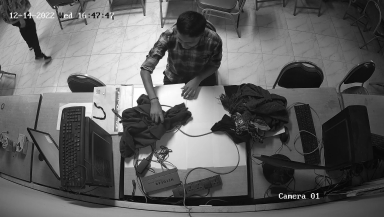

-------------------------------Number of image: 26-----------Cluster=2.


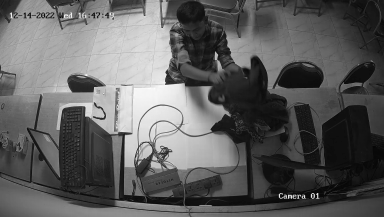

-------------------------------Number of image: 27-----------Cluster=2.


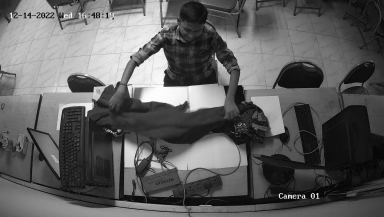

-------------------------------Number of image: 28-----------Cluster=2.


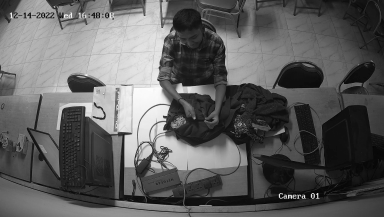

-------------------------------Number of image: 29-----------Cluster=2.


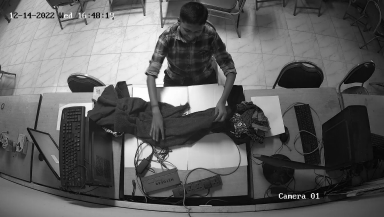

-------------------------------Number of image: 30-----------Cluster=2.


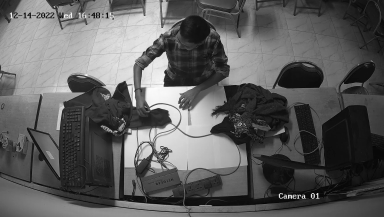

-------------------------------Number of image: 31-----------Cluster=2.


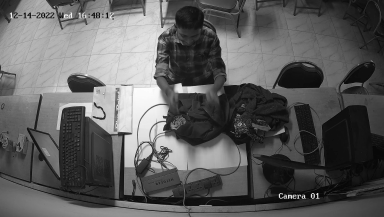

-------------------------------Number of image: 32-----------Cluster=2.


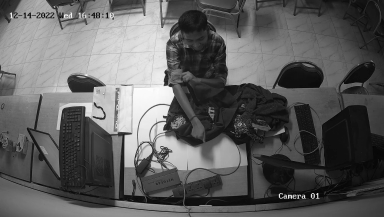

-------------------------------Number of image: 33-----------Cluster=2.


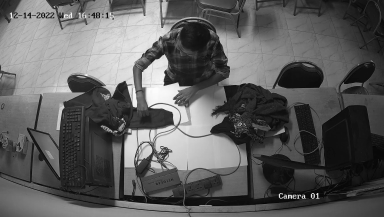

In [ ]:
kmeans=compareAndTestWithKNN(m,w,h, mean, 3)

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


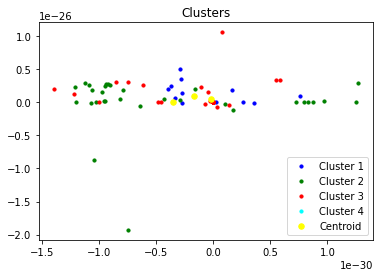

In [ ]:
scatterPlot(kmeans,w)